In [1]:
import torch

In [2]:
SEED = 12345
torch.manual_seed(SEED)
import random
random.seed(SEED)

In [3]:
from igre_ppo import IgrePPOTrainer
from igre_v0 import Igre

In [4]:
from transformers import AutoTokenizer
tokenizer = AutoTokenizer.from_pretrained("mistralai/Mistral-7B-Instruct-v0.1")
tokenizer

LlamaTokenizerFast(name_or_path='mistralai/Mistral-7B-Instruct-v0.1', vocab_size=32000, model_max_length=1000000000000000019884624838656, is_fast=True, padding_side='left', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>'}, clean_up_tokenization_spaces=False),  added_tokens_decoder={
	0: AddedToken("<unk>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	1: AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	2: AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
}

In [5]:
model = Igre(32, tokenizer.vocab_size, tokenizer, use_jamba=True)
model.cuda()

/home/mocuto/anaconda3/envs/m2/lib/python3.10/site-packages/torch/nn/modules/transformer.py:286: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Igre(
  (encoder): iEncoderJamba(
    (mixer): JambaModel(
      (embed_tokens): Embedding(32002, 32, padding_idx=0)
      (layers): ModuleList(
        (0-3): 4 x JambaMambaDecoderLayer(
          (mamba): JambaMambaMixer(
            (conv1d): Conv1d(64, 64, kernel_size=(4,), stride=(1,), padding=(3,), groups=64)
            (act): SiLU()
            (in_proj): Linear(in_features=32, out_features=128, bias=False)
            (x_proj): Linear(in_features=64, out_features=34, bias=False)
            (dt_proj): Linear(in_features=2, out_features=64, bias=True)
            (out_proj): Linear(in_features=64, out_features=32, bias=False)
            (dt_layernorm): JambaRMSNorm()
            (B_layernorm): JambaRMSNorm()
            (C_layernorm): JambaRMSNorm()
          )
          (moe): JambaSparseMoeBlock(
            (experts): ModuleList(
              (0): JambaMLP(
                (gate_proj): Linear(in_features=32, out_features=128, bias=False)
                (down_proj): Linear

In [6]:
ppo_trainer = IgrePPOTrainer(model)

In [7]:
import random
import re

teacher_forcing_count = 0

def get_completion(prompt):
    global teacher_forcing_count
    prompt_ids = tokenizer.encode(prompt, return_tensors="pt").cuda()
    response_ids, z = ppo_trainer.get_response(prompt_ids)
    metadata = {
        "z": z,
    }
    use_teacher_forcing = random.random() < 0.5
    if use_teacher_forcing and teacher_forcing_count < 1000:
        teacher_forcing_count += 1
        print("use teacher forcing")
        finish_X_re = re.compile("finish ([ABCD])")
        match = finish_X_re.search(prompt)
        if match:
            finish_X = match.group(0)
            return finish_X, metadata
    print("completion response ids")
    print(response_ids)
    return tokenizer.decode(response_ids.squeeze(0), skip_special_tokens=True), metadata

In [8]:
get_completion("test")

DEBUG GENERATE
seq_cat tensor([[   1, 1369]], device='cuda:0')
<s> test
DEBUG SAMPLE TOKENS
D 384
tensor([0.0174], device='cuda:0')
----
</s> 2
tensor([0.0248], device='cuda:0')
----
A 330
tensor([-0.2521], device='cuda:0')
----
B 365
tensor([0.0433], device='cuda:0')
----
C 334
tensor([0.0659], device='cuda:0')
----
finish 7446
tensor([0.0286], device='cuda:0')
----
token tensor([334], device='cuda:0')
DEBUG GENERATE
seq_cat tensor([[   1, 1369,  334]], device='cuda:0')
<s> test C
DEBUG SAMPLE TOKENS
D 384
tensor([-0.2334], device='cuda:0')
----
</s> 2
tensor([0.0930], device='cuda:0')
----
A 330
tensor([0.0927], device='cuda:0')
----
B 365
tensor([-0.0422], device='cuda:0')
----
C 334
tensor([0.4943], device='cuda:0')
----
finish 7446
tensor([-0.1893], device='cuda:0')
----
token tensor([334], device='cuda:0')
--------- DEBUG GENERATE FINAL -------- 
final_seq tensor([[   1, 1369,  334,  334]], device='cuda:0')
<s> test C C
use teacher forcing
completion response ids
tensor([[334, 33

('C C',
 {'z': tensor([[-0., 0., -0., -0., 0., -0., -0., 0., -0., -0., 0., -0., -0., -0., -0., -0., 0., 0., -0., -0., -0., 0., -0., 0.,
           -0., 0., 0., 0., -0., -0., 0., 0.]], device='cuda:0')})

In [9]:
from simulation.sim_runner import SimRunner
from simulation.common.base_actor import AIActor

modules
['/home/mocuto/code/mamba-chat/simulation/sim3/__init__.py', '/home/mocuto/code/mamba-chat/simulation/sim0/__init__.py']
y
simulation.sim3
y
simulation.sim0


In [10]:
tokenizer.encode("test", return_tensors="pt", add_special_tokens=False)

tensor([[1369]])

In [11]:
def process_transition(transition):
    if isinstance(transition.actor, AIActor) and transition.actor.name == "player":
        prompt = transition.action.completion_prompt
        response = transition.action.completion_response
        prompt_ids = tokenizer.encode(prompt, return_tensors="pt")
        response_ids = tokenizer.encode(response, return_tensors="pt", add_special_tokens=False).long()
        # Add eos token to response_ids
        response_ids = torch.cat([response_ids, torch.tensor([[tokenizer.eos_token_id]], dtype=torch.long)], dim=1).long()  # type: ignore

        z = transition.action.metadata["z"]
        judge_score = transition.next_state.judge_score
        reward = (
            1.0
            if transition.next_state.judge_score is True
            else -1 if judge_score is False else 0
        )
        # if reward == -1:
        #     if response.startswith("finish"):
        #         reward = 0.5
        reward = torch.tensor([reward])
        print(f"prompt: {prompt}")
        print(f"response: {response}")
        ppo_trainer.add_transition(
            prompt_ids.squeeze(0),
            response_ids.squeeze(0),
            z,
            reward,
            transition.next_state.is_terminal,
        )


def run():
    sim_name = "sim3"
    sim_runner = SimRunner(
        sim_name=sim_name,
        seed=1,
        model_forward_func_for_ai={
            "player": get_completion,
        },
    )
    while not sim_runner.get_state().is_terminal:
        transitions = sim_runner.step()
        for x in transitions:
            if isinstance(x.actor, AIActor) and x.actor.name == "player":
                process_transition(x)
    print("done")
    final_transitions = sim_runner.final()
    did_win = False
    for x in final_transitions:
        process_transition(x)
        if x.next_state.judge_score:
            did_win = True
    return did_win

run()

DEBUG GENERATE
seq_cat tensor([[    1,  1298, 15882,  1024,   528, 28747,  7446,   365,    13,    13,
         28802, 28762,  1990,   320, 12071, 28747]], device='cuda:0')
<s> Repeat after me: finish B

YOUR TURN:
DEBUG SAMPLE TOKENS
D 384
tensor([0.1456], device='cuda:0')
----
</s> 2
tensor([0.0104], device='cuda:0')
----
A 330
tensor([-0.0345], device='cuda:0')
----
B 365
tensor([0.1202], device='cuda:0')
----
C 334
tensor([0.0458], device='cuda:0')
----
finish 7446
tensor([-0.0208], device='cuda:0')
----
token tensor([384], device='cuda:0')
DEBUG GENERATE
seq_cat tensor([[    1,  1298, 15882,  1024,   528, 28747,  7446,   365,    13,    13,
         28802, 28762,  1990,   320, 12071, 28747,   384]], device='cuda:0')
<s> Repeat after me: finish B

YOUR TURN: D
DEBUG SAMPLE TOKENS
D 384
tensor([0.7695], device='cuda:0')
----
</s> 2
tensor([-0.0701], device='cuda:0')
----
A 330
tensor([-0.2714], device='cuda:0')
----
B 365
tensor([0.0455], device='cuda:0')
----
C 334
tensor([-0.1245], 

True

In [12]:
tokenizer.eos_token_id

2

In [13]:
import matplotlib.pyplot as plt
from IPython import display
import time

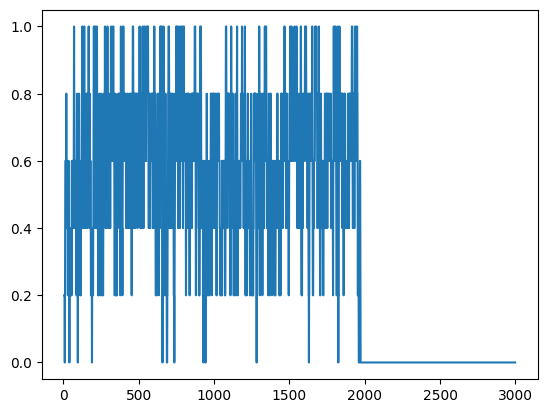

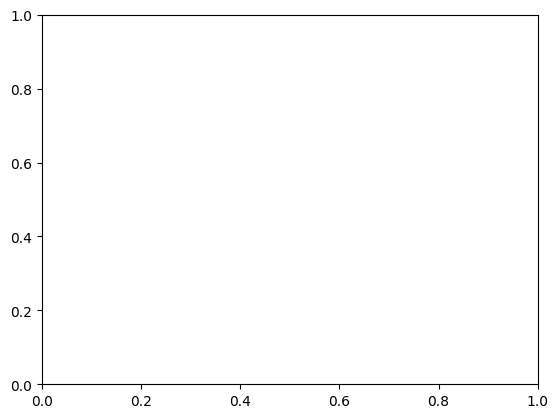

In [14]:
%matplotlib inline

def pltsin(ax, fig, x, y, hdisplay):
    if ax.lines:
        for line in ax.lines:
            line.set_xdata(x)
            line.set_ydata(y)
            # update scale
            ax.relim()
            ax.autoscale_view()

    else:
        ax.plot(x, y)
    hdisplay.update(fig)
    time.sleep(1)
fig, ax = plt.subplots(1, 1)
hdisplay = display.display("", display_id=True)
ax.set_label("game_count")
ax.set_label("win_rate")

In [15]:

game_count = 3000

results = []
xs = []
ys = []

for i in range(game_count):
    did_win = run()
    results.append(int(did_win))
    if i > 5:
        win_rate = sum(results[-5:]) / 5
        xs.append(i)
        ys.append(win_rate)
        pltsin(ax, fig, xs, ys, hdisplay)
    if i % 8 == 0:
        ppo_trainer.update()
    if i % 8 == 0:
        ppo_trainer.reset_memory()
    if i % 501 == 0:
        display.clear_output(wait=True)
    if i % 1000 == 0:
        torch.save(model.state_dict(), f"model_{i}.pt")
        print(f"model saved at {i}")
        ppo_trainer.reset_memory()

DEBUG GENERATE
seq_cat tensor([[    1,  1298, 15882,  1024,   528, 28747,  7446,   384,    13,    13,
         28802, 28762,  1990,   320, 12071, 28747]], device='cuda:0')
<s> Repeat after me: finish D

YOUR TURN:
DEBUG SAMPLE TOKENS
D 384
tensor([-1.5822], device='cuda:0')
----
</s> 2
tensor([-2.3754], device='cuda:0')
----
A 330
tensor([-1.2655], device='cuda:0')
----
B 365
tensor([-1.5837], device='cuda:0')
----
C 334
tensor([-1.5985], device='cuda:0')
----
finish 7446
tensor([-0.7605], device='cuda:0')
----
token tensor([7446], device='cuda:0')
DEBUG GENERATE
seq_cat tensor([[    1,  1298, 15882,  1024,   528, 28747,  7446,   384,    13,    13,
         28802, 28762,  1990,   320, 12071, 28747,  7446]], device='cuda:0')
<s> Repeat after me: finish D

YOUR TURN: finish
DEBUG SAMPLE TOKENS
D 384
tensor([-1.6797], device='cuda:0')
----
</s> 2
tensor([-2.3454], device='cuda:0')
----
A 330
tensor([-1.3166], device='cuda:0')
----
B 365
tensor([-1.6069], device='cuda:0')
----
C 334
tensor